In [1]:
from datasets.load import load_images
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import pickle

%matplotlib inline
plt.rcParams['figure.figsize'] = (15., 12.) # set default size of plots
#plt.rcParams['image.interpolation'] = 'nearest'
#plt.rcParams['image.cmap'] = 'gray'

# for auto-reloading extenrnal modules
%load_ext autoreload
%autoreload 2

In [2]:
plt.rcParams['figure.figsize'] = (15., 12.) # set default size of plots


In [3]:
samples = load_images('train', 'datasets')

[{'name': 'waldo', 'bounds': [{'x1': 703, 'y1': 507, 'x2': 741, 'y2': 581}]}]


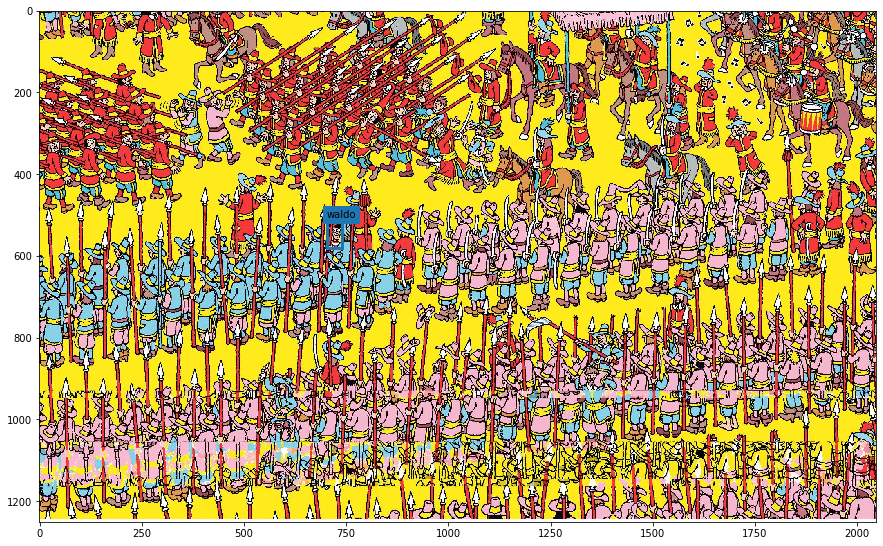

[{'name': 'waldo', 'bounds': [{'x1': 1538, 'y1': 484, 'x2': 2330, 'y2': 2553}, {'x1': 216, 'y1': 5139, 'x2': 408, 'y2': 5291}, {'x1': 969, 'y1': 5139, 'x2': 1173, 'y2': 5339}, {'x1': 1747, 'y1': 5148, 'x2': 1921, 'y2': 5330}, {'x1': 2451, 'y1': 5152, 'x2': 2647, 'y2': 5317}, {'x1': 3264, 'y1': 5657, 'x2': 3464, 'y2': 5804}, {'x1': 3921, 'y1': 5187, 'x2': 4138, 'y2': 5378}]}, {'name': 'wizard', 'bounds': [{'x1': 892, 'y1': 538, 'x2': 1776, 'y2': 2576}]}, {'name': 'wenda', 'bounds': [{'x1': 2230, 'y1': 645, 'x2': 2938, 'y2': 2599}]}]


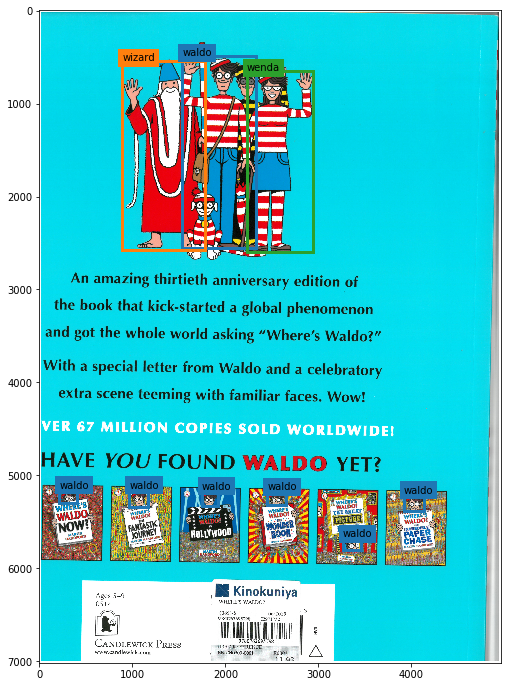

[{'name': 'wenda', 'bounds': [{'x1': 4343, 'y1': 4303, 'x2': 4428, 'y2': 4447}, {'x1': 259, 'y1': 4018, 'x2': 444, 'y2': 4458}]}, {'name': 'wizard', 'bounds': [{'x1': 5866, 'y1': 3911, 'x2': 5935, 'y2': 4006}, {'x1': 19, 'y1': 3993, 'x2': 199, 'y2': 4458}]}, {'name': 'waldo', 'bounds': [{'x1': 5368, 'y1': 388, 'x2': 5439, 'y2': 557}, {'x1': 24, 'y1': 463, 'x2': 509, 'y2': 1573}, {'x1': 659, 'y1': 3998, 'x2': 884, 'y2': 4483}]}]


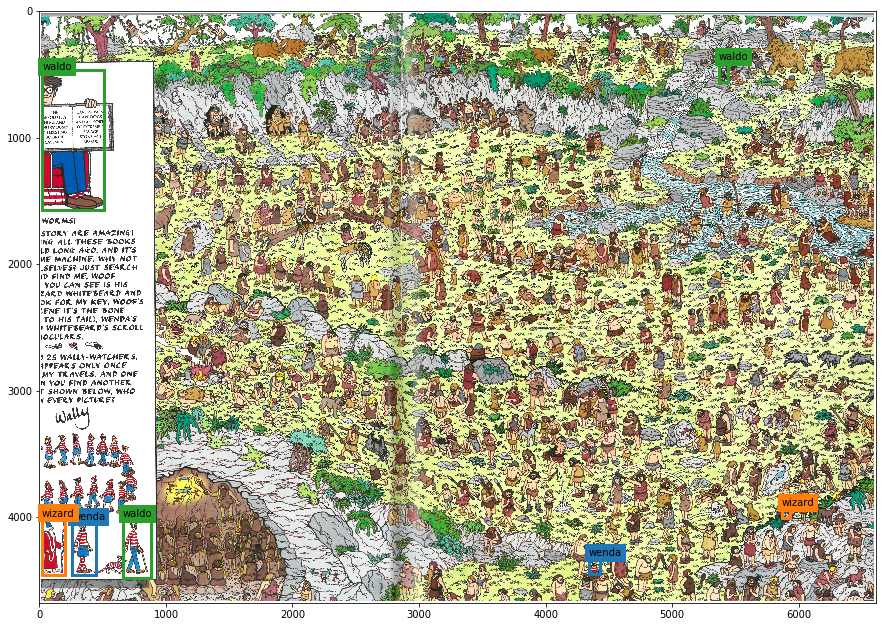

[{'name': 'waldo', 'bounds': [{'x1': 230, 'y1': 735, 'x2': 265, 'y2': 768}]}]


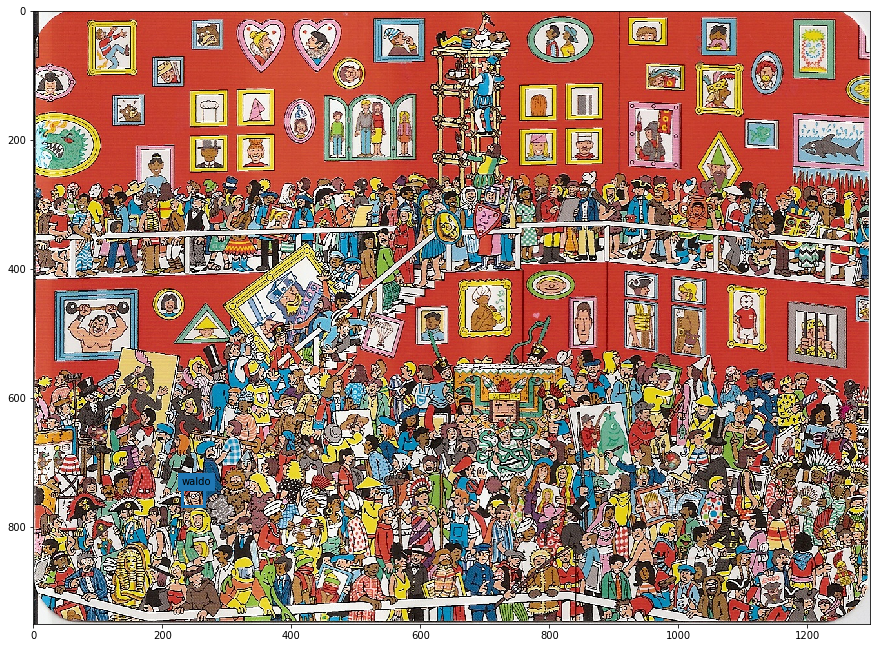

[{'name': 'waldo', 'bounds': [{'x1': 2247, 'y1': 4716, 'x2': 2337, 'y2': 4823}]}, {'name': 'wenda', 'bounds': [{'x1': 4979, 'y1': 5802, 'x2': 5081, 'y2': 6214}]}]


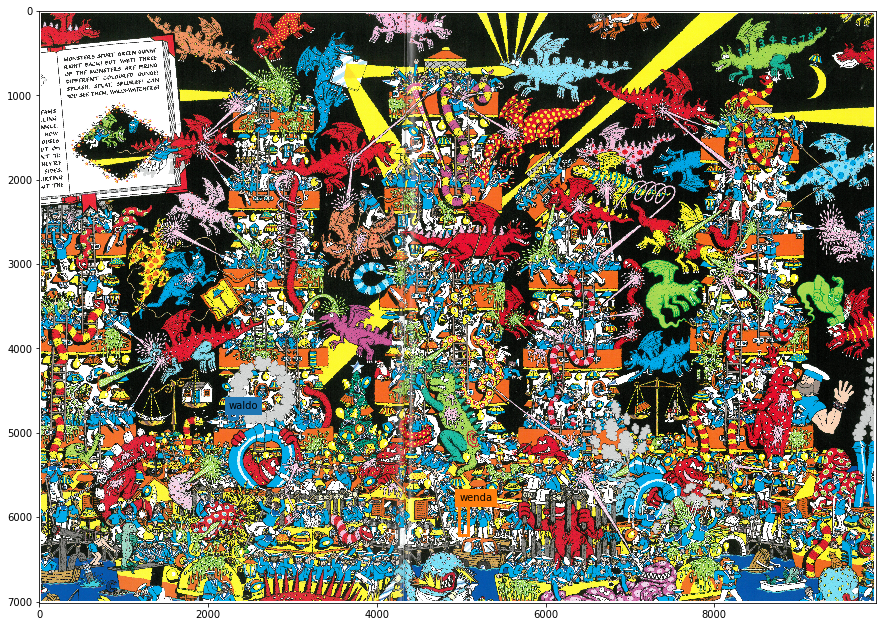

In [7]:
def draw_bbox(ax, name, box, col='r'):
    r = patches.Rectangle((box['x1'], box['y1']), 
                          box['x2'] - box['x1'],
                          box['y2'] - box['y1'],
                          linewidth=3,
                          edgecolor=col,
                          facecolor='none')
    ax.add_patch(r)
    ax.text(box['x1'], box['y1'], name,
            bbox={'facecolor': col, 'linewidth': 0})

def draw_annotation(ax, classes):
    colors = plt.get_cmap('tab10')
    for idx, cl in enumerate(classes):
        col = colors(idx)
        for box in cl['bounds']:
            draw_bbox(ax, cl['name'], box, col)

for sample in np.random.choice(samples, 5, replace=False):
    fig, ax = plt.subplots(1)
    ax.imshow(sample['img'])
    print(sample['classes'])
    draw_annotation(ax, sample['classes'])
    plt.show()

In [10]:
import math
def generate_pos_samples(samples, blowup=1):
    res = []
    for sample in samples:
        for cl in sample['classes']:
            for box in cl['bounds']:
                scales = np.random.uniform(low=1, high=10, size=(blowup,))
                for s in scales:
                    try:
                        ymin, ymax = box['y1'], box['y2']
                        xmin, xmax = box['x1'], box['x2']
                        sx = math.ceil((ymax - ymin)*s/2)
                        sy = math.ceil((xmax - xmin)*s/2)
                        ymin, ymax = ymin - sy, ymax + sy
                        xmin, xmax = xmin - sy, xmax + sy
                        
                        img = sample['img'][ymin:ymax, xmin:xmax]
                        if img.size != 0:
                            #print(img)
                            res.append(dict(
                                name = cl['name'],
                                img = img,
                                scale = 1/s,
                                bbox = {'x1': box['x1'] - xmin,
                                        'y1': box['y1'] - ymin,
                                        'x2': box['x2'] - xmin,
                                        'y2': box['y2'] - ymin}                           
                            ))
                    except Exception as e:
                        print(e)
    np.random.shuffle(res)
    return res

pos_samples = generate_pos_samples(samples, 5)

num samples: 62
num scaled samples: 683


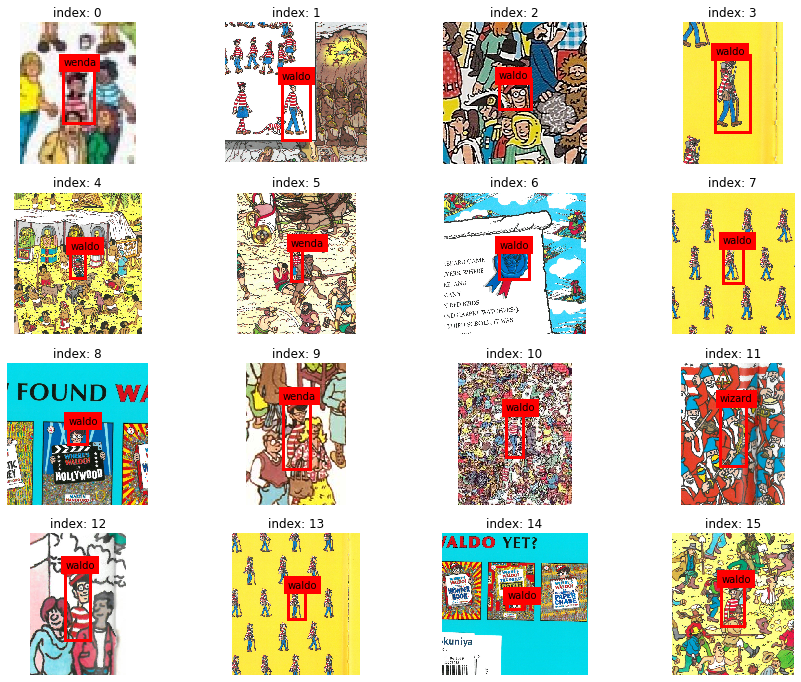

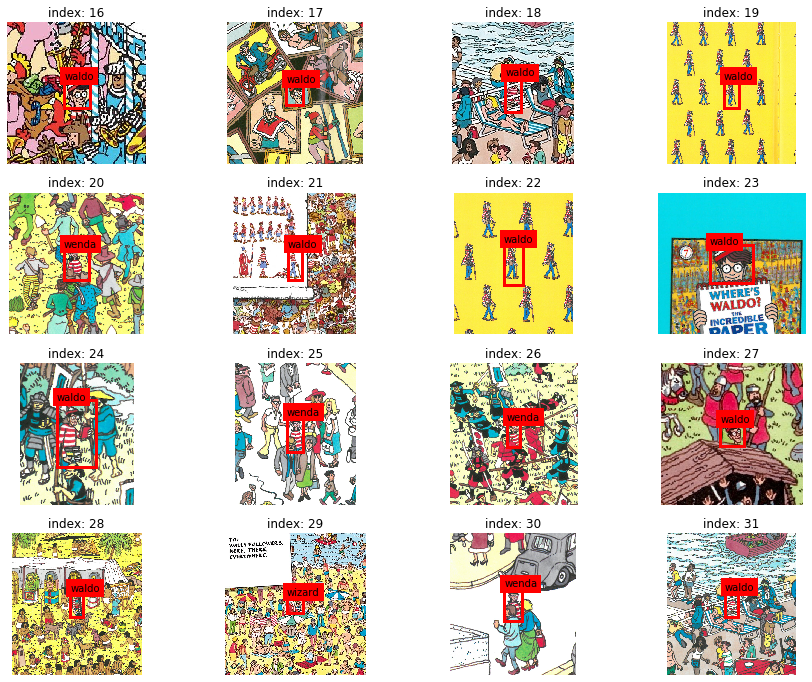

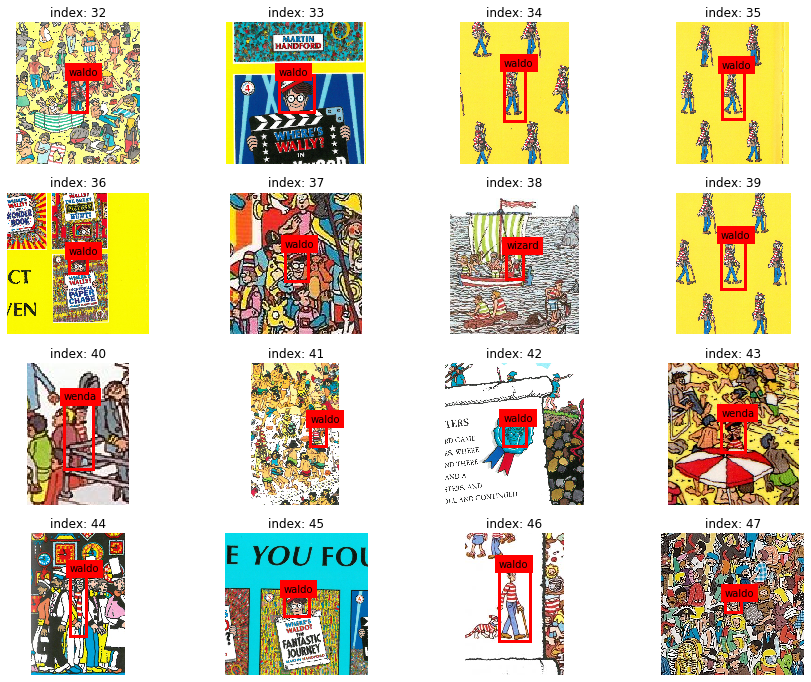

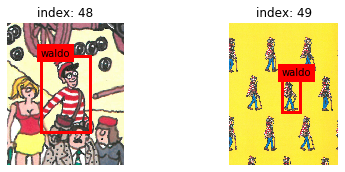

In [11]:
print('num samples: {}'.format(len(samples)))
print('num scaled samples: {}'.format(len(pos_samples)))


for idx, sample in enumerate(pos_samples[:50]):
    if idx != 0 and idx % 16 == 0:
        plt.show()
    ax = plt.subplot(4,4,(idx % 16)+1)
    plt.title('index: {}'.format(idx))
    ax.imshow(sample['img'])
    plt.axis('off')
    draw_bbox(ax, sample['name'], sample['bbox'])
    
plt.show()

In [12]:
## save first image sample
idx = 0
with open('cache/waldo{}.pkl'.format(idx), 'wb') as f:
    pickle.dump(pos_samples[idx], f)